# Решающие деревья. Домашнее задание

## Что нужно сделать
Решите задачу классификации оттоковых клиентов телекома: для каждого клиента необходимо определить, перестанет он пользоваться услугами оператора в ближайшее время или нет.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


In [2]:
df = pd.read_csv("./telecom_churn.csv")
df.head()

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


Сделайте первичную обработку данных:

1. Выбросите колонку State.

2. Колонки International plan и Voice mail plan закодируйте следующим образом: Yes замените на 1, а No на 0.

3. Переведите целевую переменную (Churn) в числа: True в 1, а False в 0.

In [3]:
if 'State' in df.columns:
    df.drop(columns=['State'], inplace=True)
df.head()

,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Account length          3333 non-null   int64  
 1   Area code               3333 non-null   int64  
 2   International plan      3333 non-null   object 
 3   Voice mail plan         3333 non-null   object 
 4   Number vmail messages   3333 non-null   int64  
 5   Total day minutes       3333 non-null   float64
 6   Total day calls         3333 non-null   int64  
 7   Total day charge        3333 non-null   float64
 8   Total eve minutes       3333 non-null   float64
 9   Total eve calls         3333 non-null   int64  
 10  Total eve charge        3333 non-null   float64
 11  Total night minutes     3333 non-null   float64
 12  Total night calls       3333 non-null   int64  
 13  Total night charge      3333 non-null   float64
 14  Total intl minutes      3333 non-null   

In [5]:
df['Voice mail plan'] = df['Voice mail plan'].map({'Yes':1, 'No':0})
df['International plan'] = df['International plan'].map({'Yes':1, 'No':0})#.value_counts()
df['Churn'] = df['Churn'].map({True:1, False:0})

Выведите на экран первые строки изменённой таблицы, чтобы проверить, что все преобразования сработали.

In [6]:
df.head()

,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,128,415,0,1,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,0
1,107,415,0,1,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0
2,137,415,0,0,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0
3,84,408,1,0,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,0
4,75,415,1,0,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,0


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Account length          3333 non-null   int64  
 1   Area code               3333 non-null   int64  
 2   International plan      3333 non-null   int64  
 3   Voice mail plan         3333 non-null   int64  
 4   Number vmail messages   3333 non-null   int64  
 5   Total day minutes       3333 non-null   float64
 6   Total day calls         3333 non-null   int64  
 7   Total day charge        3333 non-null   float64
 8   Total eve minutes       3333 non-null   float64
 9   Total eve calls         3333 non-null   int64  
 10  Total eve charge        3333 non-null   float64
 11  Total night minutes     3333 non-null   float64
 12  Total night calls       3333 non-null   int64  
 13  Total night charge      3333 non-null   float64
 14  Total intl minutes      3333 non-null   

Создайте матрицу объект-признак X и вектор с целевой переменной (Churn) y.

In [8]:
target_feature = 'Churn'
X = df.drop(columns=target_feature)
y = df[target_feature] 
X.shape, y.shape

((3333, 18), (3333,))

Проверьте баланс классов. Является ли выборка сбалансированной?

In [9]:
y.value_counts()
# Датасет не является сбалансированным с т.з. целевой переменной.

Churn
0    2850
1     483
Name: count, dtype: int64

In [10]:
X.describe()

,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls
count,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000
mean,101.064806,437.182418,0.096910,0.276628,8.099010,179.775098,100.435644,30.562307,200.980348,100.114311,17.083540,200.872037,100.107711,9.039325,10.237294,4.479448,2.764581,1.562856
std,39.822106,42.371290,0.295879,0.447398,13.688365,54.467389,20.069084,9.259435,50.713844,19.922625,4.310668,50.573847,19.568609,2.275873,2.791840,2.461214,0.753773,1.315491
min,1.000000,408.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.200000,33.000000,1.040000,0.000000,0.000000,0.000000,0.000000
25%,74.000000,408.000000,0.000000,0.000000,0.000000,143.700000,87.000000,24.430000,166.600000,87.000000,14.160000,167.000000,87.000000,7.520000,8.500000,3.000000,2.300000,1.000000
50%,101.000000,415.000000,0.000000,0.000000,0.000000,179.400000,101.000000,30.500000,201.400000,100.000000,17.120000,201.200000,100.000000,9.050000,10.300000,4.000000,2.780000,1.000000
75%,127.000000,510.000000,0.000000,1.000000,20.000000,216.400000,114.000000,36.790000,235.300000,114.000000,20.000000,235.300000,113.000000,10.590000,12.100000,6.000000,3.270000,2.000000
max,243.000000,510.000000,1.000000,1.000000,51.000000,350.800000,165.000000,59.640000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000


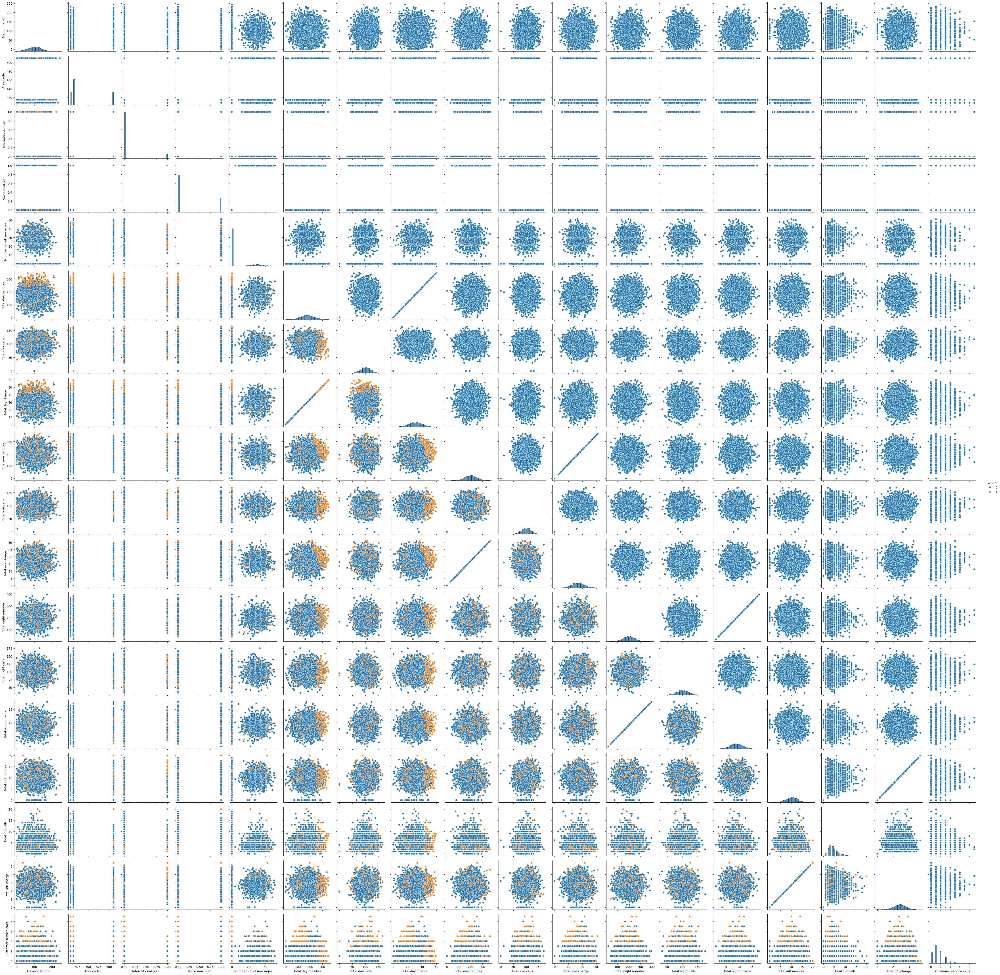

In [11]:
g1 = sns.PairGrid(df, height = 2.5, hue=target_feature)
g1.map_diag(sns.histplot, bins=30, hue=None)
g1.map_lower(sns.scatterplot)
g1.map_upper(sns.scatterplot, hue=None)
g1.add_legend();

Видим, что данные линейно плохо разделимы

Разбейте данные на тренировочную и тестовую части, размер тестовой части — 30%.

In [12]:
from sklearn.model_selection import train_test_split

In [13]:
X_train, X_test, y_train, y_test = train_test_split(X, y\
                                                    , train_size=0.7\
                                                    , random_state=42
                                                    , stratify=y)
print(f'{[el.shape for el in [X_train, X_test, y_train, y_test]]}')

[(2333, 18), (1000, 18), (2333,), (1000,)]


Для линейных моделей очень важно масштабирование признаков. Поэтому отмасштабируйте признаки при помощи [StandardScaler](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html), обучив метод на тренировочных данных и применив его и к трейну, и к тесту.

In [14]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [15]:
scaler.fit(X_train)
X_train_scaled = pd.DataFrame(scaler.transform(X_train), columns=X.columns)
X_test_scaled = pd.DataFrame(scaler.transform(X_test), columns=X.columns)

In [16]:
X_test_scaled.head()

,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls
0,0.635777,-0.677798,-0.318608,-0.628757,-0.601437,0.591610,-1.510956,0.591334,0.303368,-1.010251,0.304133,-0.942862,-2.052450,-0.941733,-0.856263,-1.443780,-0.851688,-0.432951
1,-0.188705,1.756591,3.138656,-0.628757,-0.601437,-0.895386,-1.111680,-0.895230,0.358179,0.285716,0.357102,-0.898720,0.151124,-0.897147,0.305127,-1.031044,0.308388,-0.432951
2,-1.612809,1.756591,-0.318608,1.590440,1.221692,-0.498607,0.485425,-0.498231,0.810373,-1.658234,0.810798,-1.065254,-1.335008,-1.066574,-0.398746,-1.031044,-0.395478,-0.432951
3,-0.313626,-0.677798,-0.318608,-0.628757,-0.601437,1.759699,0.235878,1.759427,-0.788944,1.033389,-0.789804,-0.122234,1.176042,-0.121346,-0.363552,-0.205572,-0.369409,0.336923
4,-0.488516,1.756591,-0.318608,-0.628757,-0.601437,-0.632103,-2.059961,-0.632382,1.693227,1.531838,1.692857,-0.377050,1.073550,-0.375488,-0.363552,-0.205572,-0.369409,0.336923


После масштабирования признаков X_train и X_test перестали быть объектами типа pd.DataFrame, это неудобно. Приведите их снова к pd.DataFrame.

In [17]:
# Сделано выше

Обучите на тренировочных данных с параметрами по умолчанию:

1) логистическую регрессию;

2) метод опорных векторов (с kernel='linear').

In [18]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
model_lr = LogisticRegression()
model_svc = SVC(kernel='linear')

In [19]:
model_lr.fit(X_train_scaled, y_train)
model_svc.fit(X_train_scaled, y_train)

SVC(kernel='linear')

С помощью обученных моделей сделайте предсказание на тестовых данных.

In [20]:
y_test_pred_lr = model_lr.predict(X_test)
y_test_pred_svc = model_svc.predict(X_test)

In [21]:
from sklearn.metrics import roc_auc_score


In [22]:
print(f'roc_auc logistic_regresson : {roc_auc_score(y_test, y_test_pred_lr)}')
print(f'roc_auc SVC classifier : {roc_auc_score(y_test, y_test_pred_svc)}')

roc_auc logistic_regresson : 0.5
roc_auc SVC classifier : 0.5


Теперь обучите решающее дерево с параметрами по умолчанию на тренировочных данных, сделайте предсказание на тесте. Используйте метрику для оценки.

In [23]:
from sklearn.tree import DecisionTreeClassifier
model_dtc = DecisionTreeClassifier()

Нужно ли масшабировать признаки для обучения решающего дерева? Проверьте это, заново разбив данные на тренировочную и тестовую части (назовите новые полученные объекты новыми названиями), и проведите обучение, предсказание и оценку метрики до масштабирования и после.

In [24]:
# Обучим модель на немасштабированных данных
# Выполним предсказания на тренировочном и тестовом датасете
model_dtc.fit(X_train, y_train)
y_train_pred_dtc_noscale = model_dtc.predict(X_train)
y_test_pred_dtc_noscale = model_dtc.predict(X_test)

In [25]:
model_dtc.fit(X_train_scaled, y_train)
y_train_pred_dtc_scale = model_dtc.predict(X_train_scaled)
y_test_pred_dtc_scale = model_dtc.predict(X_test_scaled)

In [135]:
print(f'roc_auc decision tree train no scale : {roc_auc_score(y_train, y_train_pred_dtc_noscale)}')
print(f'roc_auc decision tree test  no scale : {roc_auc_score(y_test, y_test_pred_dtc_noscale)}')
print(f'roc_auc decision tree train scale    : {roc_auc_score(y_train, y_train_pred_dtc_scale)}')
print(f'roc_auc decision tree test  scale    : {roc_auc_score(y_test, y_test_pred_dtc_scale)}')

roc_auc decision tree train no scale : 1.0
roc_auc decision tree test  no scale : 0.8082274652147611
roc_auc decision tree train scale    : 1.0
roc_auc decision tree test  scale    : 0.8029643073200243


Какая модель справилась с решением задачи?

Выводы:\
Видим, что модель на основе алгоритма решающего дерева с гиперпараметрами по умолчанию имеет самую высокую метрику.
Для алгоритма решающего дерева масштабирования признаков не требуется. 
Т.к. в задачах классификации, в частности, алгоритм при решении задачи разделения выборки не имеет значение количественное значение 
признака, а имеет значение состав объектов попавших в выборку до разделения.\

Так же наблюдаем ситуацию переобучения с гиперпараметрами по умолчанию.
